## Exploratory Data Analysis on FIFA 2021 Dataset.

<img src="WallpaperDog-20367517.jpg" width="500" height="500">

# 1) Problem statement

- This project understands how the players potential is affected by other variables such as age, height, weight and other features which are given in dataset

# 2) Data Collection

- Dataset Source - https://www.kaggle.com/datasets/stefanoleone992/fifa-21-complete-player-dataset
- The data consists of 18944 rows and 106 columns



In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.preprocessing import LabelEncoder
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [3]:
data_fifa = pd.read_csv('data/players_21.csv')

In [4]:
data_fifa.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,...,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,...,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,...,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,67+3,62+3,62+3,62+3,67+3,62+3,49+3,49+3,49+3,62+3


In [5]:
for col in data_fifa.columns:
    print(col)

sofifa_id
player_url
short_name
long_name
age
dob
height_cm
weight_kg
nationality
club_name
league_name
league_rank
overall
potential
value_eur
wage_eur
player_positions
preferred_foot
international_reputation
weak_foot
skill_moves
work_rate
body_type
real_face
release_clause_eur
player_tags
team_position
team_jersey_number
loaned_from
joined
contract_valid_until
nation_position
nation_jersey_number
pace
shooting
passing
dribbling
defending
physic
gk_diving
gk_handling
gk_kicking
gk_reflexes
gk_speed
gk_positioning
player_traits
attacking_crossing
attacking_finishing
attacking_heading_accuracy
attacking_short_passing
attacking_volleys
skill_dribbling
skill_curve
skill_fk_accuracy
skill_long_passing
skill_ball_control
movement_acceleration
movement_sprint_speed
movement_agility
movement_reactions
movement_balance
power_shot_power
power_jumping
power_stamina
power_strength
power_long_shots
mentality_aggression
mentality_interceptions
mentality_positioning
mentality_vision
mentality_penal

In [9]:
print(data_fifa.dtypes)

sofifa_id      int64
player_url    object
short_name    object
long_name     object
age            int64
               ...  
lb            object
lcb           object
cb            object
rcb           object
rb            object
Length: 106, dtype: object


In [10]:
data_fifa.shape

(18944, 106)

In [8]:
# removing extra spaces from the column names.
data_fifa.columns = [c.replace(' ', '') for c in data_fifa.columns]

In [11]:
data_fifa.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club_name',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=106)

In [12]:
# check left foot and right foot players
print(data_fifa.preferred_foot.unique())
foot_players = data_fifa['preferred_foot'].value_counts()
foot_players = foot_players.reset_index()
foot_players.columns = ['foot', 'count']
#foot_players

['Left' 'Right']


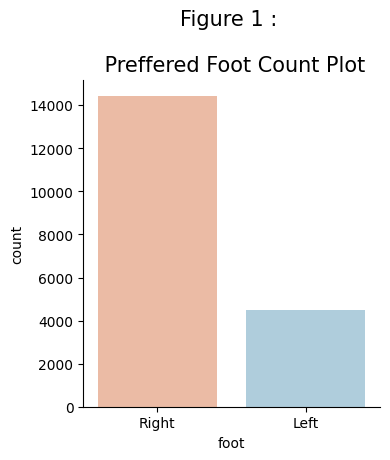

In [13]:
# making a chart of preferred foot comparison

pt = sns.catplot(y = 'count', x = 'foot', data=foot_players, palette='RdBu', height = 4, aspect = 1, kind='bar')
plt.title("Figure 1 : \n\n Preffered Foot Count Plot", fontsize=15);

In [14]:
# top 5 countries with most players
# 
nation_count = data_fifa['nationality'].value_counts()
nation_count = nation_count.reset_index()
nation_count.columns= ["Nations","Counts"]
nation_count.head()

,Nations,Counts
0,England,1685
1,Germany,1189
2,Spain,1072
3,France,984
4,Argentina,936


<h5 align="left"><font color='black'>This plot shows the count of players from each nation. We can see from the plot that the maximum players in this game belong to England, germany, spain and France. As these countries have one of the biggest football following.</font></h5>

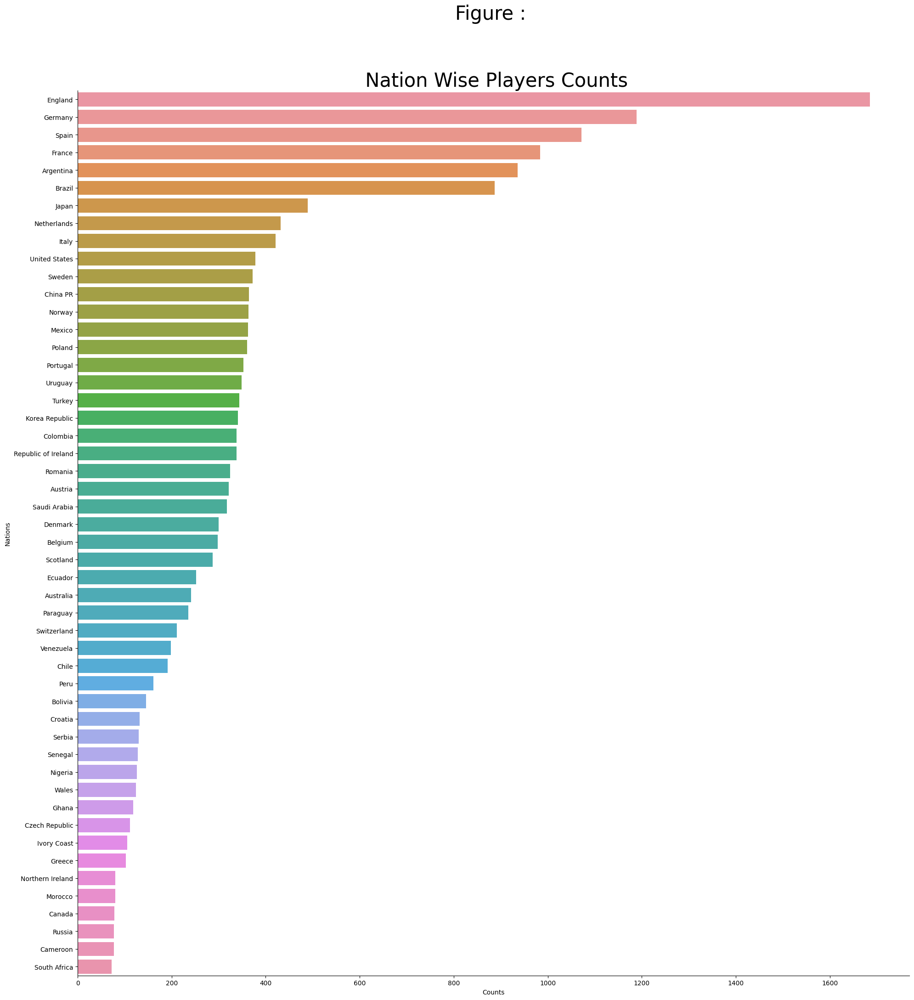

In [15]:
sns.catplot(y="Nations",
            x="Counts",data=nation_count.head(50),
            height=20,kind="bar")
plt.title("Figure : \n\n\n Nation Wise Players Counts",
          fontsize=30);

<h4 align="left"><font color='green'>Each nation's highest rated player</font></h4>

In [16]:
max_rating = data_fifa.groupby('nationality', as_index=False)['potential'].max()

In [17]:
max_rating.head()

,nationality,potential
0,Afghanistan,71
1,Albania,88
2,Algeria,85
3,Andorra,62
4,Angola,80


<h4 align="left"><font color='green'>Show the Highest rated player of each Nation</font></h4>

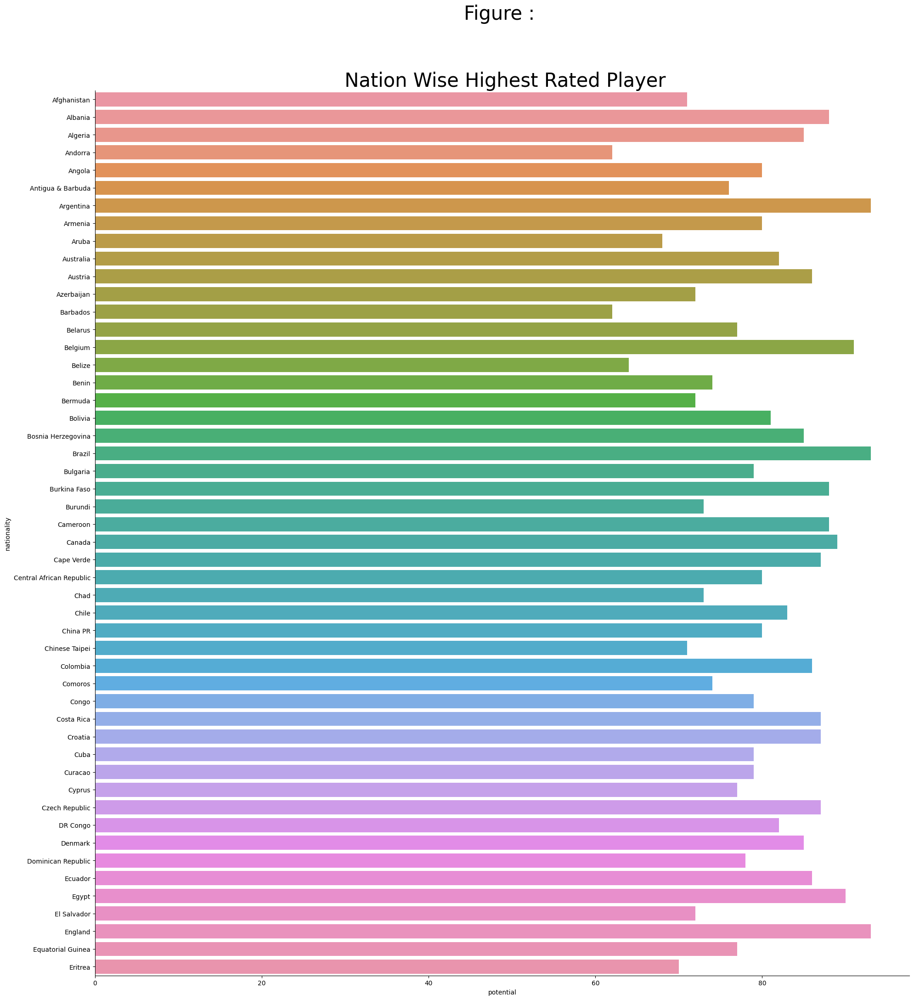

In [18]:
sns.catplot(y="nationality",
            x="potential",data=max_rating.head(50),
            height=20,kind="bar")
plt.title("Figure : \n\n\n Nation Wise Highest Rated Player",
          fontsize=30);

Inference: From the above graph we can say that the highest rated players mostly belong to countries like, Argentina, Brazil, England etc.

In [19]:
# nation wise highest paid wages
max_wages = data_fifa.groupby('nationality', as_index=False)['wage_eur'].max()
max_wages.sort_values(by="wage_eur",inplace=True,ascending=False)

In [20]:
max_wages_10 = max_wages.iloc[0:10,:]

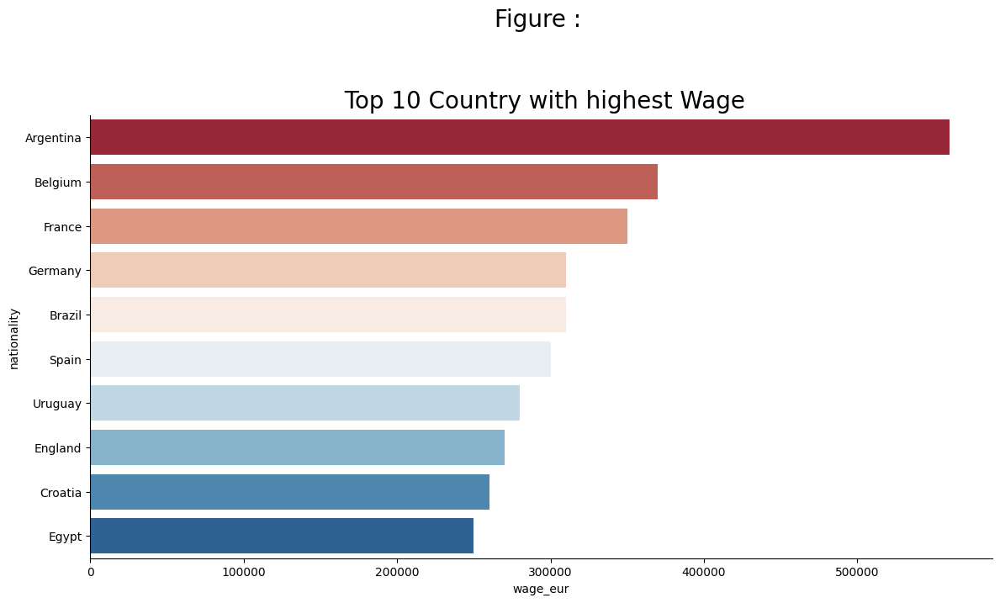

In [22]:
sns.catplot(y="nationality",
            x="wage_eur",data=max_wages_10,
            palette="RdBu",height= 6,kind="bar",aspect=2)
plt.title("Figure : \n\n\n Top 10 Country with highest Wage",
          fontsize=20);

In [23]:
data_fifa.describe()

,sofifa_id,age,height_cm,weight_kg,league_rank,overall,potential,value_eur,wage_eur,international_reputation,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18944.000000,18944.000000,18944.000000,18944.000000,18719.000000,18944.000000,18944.000000,1.894400e+04,18944.000000,18944.000000,...,18944.000000,18944.000000,0.0,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000
mean,226242.402872,25.225823,181.190773,75.016892,1.357070,65.677787,71.086729,2.224813e+06,8675.852513,1.091850,...,48.050412,57.978674,NaN,47.581767,45.546505,16.446052,16.236486,16.103357,16.225982,16.551309
std,27171.091056,4.697354,6.825672,7.057140,0.739327,7.002278,6.109985,5.102486e+06,19654.774894,0.361841,...,15.671721,12.118390,NaN,21.402461,20.953997,17.577332,16.845480,16.519399,17.017341,17.878121
min,41.000000,16.000000,155.000000,50.000000,1.000000,47.000000,47.000000,0.000000e+00,0.000000,1.000000,...,6.000000,12.000000,NaN,5.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,210030.500000,21.000000,176.000000,70.000000,1.000000,61.000000,67.000000,3.000000e+05,1000.000000,1.000000,...,38.750000,50.000000,NaN,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,232314.500000,25.000000,181.000000,75.000000,1.000000,66.000000,71.000000,6.500000e+05,3000.000000,1.000000,...,49.000000,59.000000,NaN,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,246760.250000,29.000000,186.000000,80.000000,1.000000,70.000000,75.000000,1.800000e+06,7000.000000,1.000000,...,60.000000,66.000000,NaN,65.000000,63.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,258970.000000,53.000000,206.000000,110.000000,4.000000,93.000000,95.000000,1.055000e+08,560000.000000,5.000000,...,92.000000,96.000000,NaN,93.000000,90.000000,90.000000,92.000000,93.000000,91.000000,90.000000


In [22]:
# age, height, weight, pace, shooting, passing, dribbling, defending, physic, preferred foot, week foot, skills, work rate,
# team_position, gk_diving, gk_handling, gk_kicking, gk_reflexes, gk_speed, gk_position, attacking_crossing, attacking_finishing,
# attacking_heading_accuracy, attacking_short_passing, attacking_volleys, skill_dribbling, skill_curve, skill_fk_accuracy, 
# skill_long_passing, skill_ball_control, movement_acceleration, movement_sprint_speed, movement_agility, movement_reactions,
# movement_balance, power_shot_power, power_jumping, power_stamina,power strength, power_long_shots,mentality_agression, 
# mentality_interception, mentality_positioning, mentality_vision, mentality_penalties, mentality_composure, defending_marking,
# defending_standing_tackle, defending_sliding_tackle, goalkeeping_diving, goalkeeping_handling, goalkeeping_kicking,
# goalkeeping_positioning, goalkeeping_reflexes. 

# parameters we will give to predict the players potential.

### Target Variable = potential

##### We will continue with doing an EDA

<Axes: xlabel='age', ylabel='nationality'>

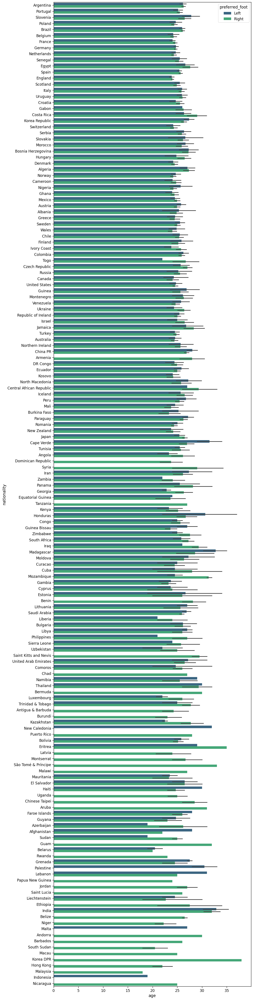

In [24]:
plt.figure(figsize=(12,60))
sns.set_context("paper",font_scale=1.4)

sns.barplot(y="nationality",
            x="age",
            data=data_fifa,
            hue="preferred_foot",
            palette="viridis")

#### Almost all countries have a right footed player. While there are some countries like Macau, Niger, Vietnam etc. which has only right footed players.

<Axes: >

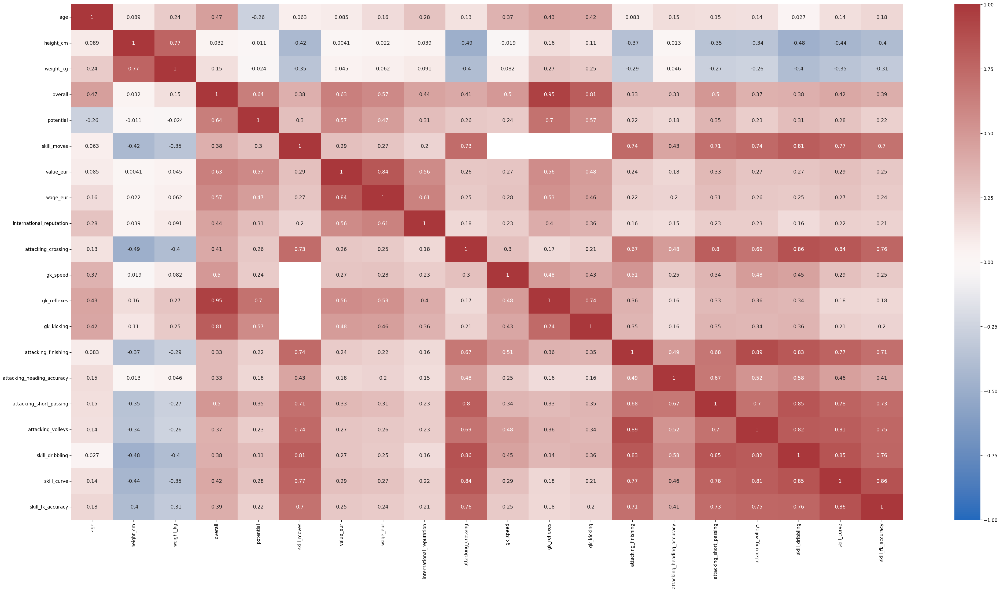

In [122]:
# Correlation heat map. 
plt.figure(figsize=(50,25))
sns.heatmap(data = data_fifa[['age','height_cm','weight_kg','overall','potential','skill_moves',
                        'value_eur','wage_eur','international_reputation','attacking_crossing','gk_speed','gk_reflexes',
                        'gk_kicking','attacking_finishing','attacking_heading_accuracy','attacking_short_passing',
                        'attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy']].corr(), 
            annot = True,  cmap = "vlag", vmin = -1, vmax = 1, center = 0)

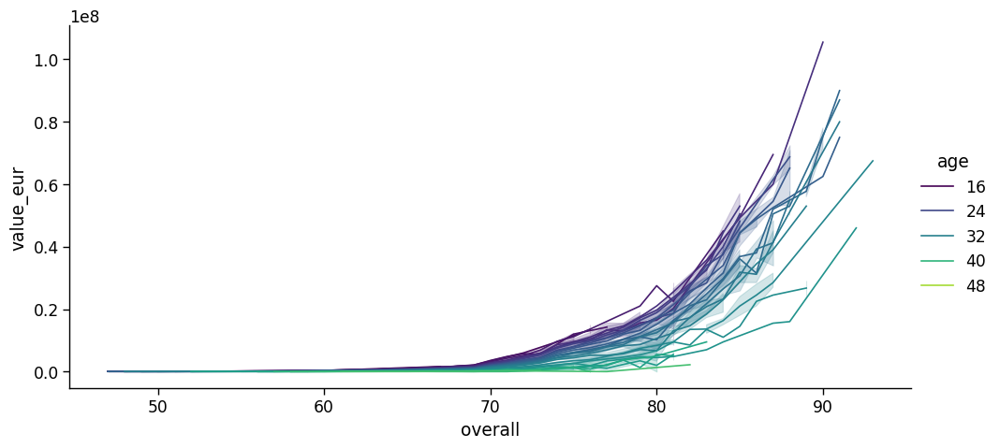

In [26]:
sns.relplot(data = data_fifa, x = 'overall', y = 'value_eur', palette = 'viridis',
            hue='age',aspect=2, kind = 'line')

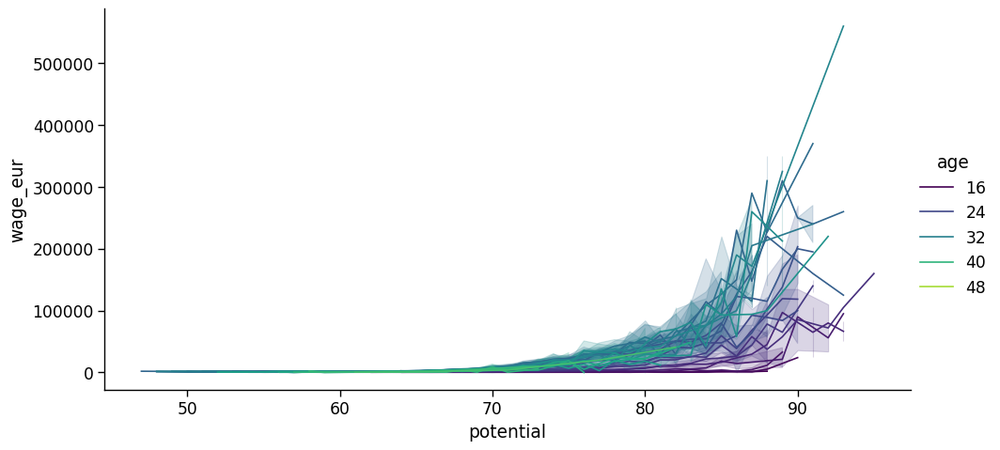

In [27]:
# This plot shows how wages are incresed as the potential of players is increased.
sns.relplot(data = data_fifa, x = 'potential', y = 'wage_eur', palette = 'viridis',
            hue='age',aspect=2, kind = 'line')

##### From the above plot we can see that, as the players potential is increasing the wages are also increasing. But we can also see that players in the range of 30 years are getting paid the most. The reason that players in this age usually are in their prime years, scoring maximum number of goals and giving top performances in games.

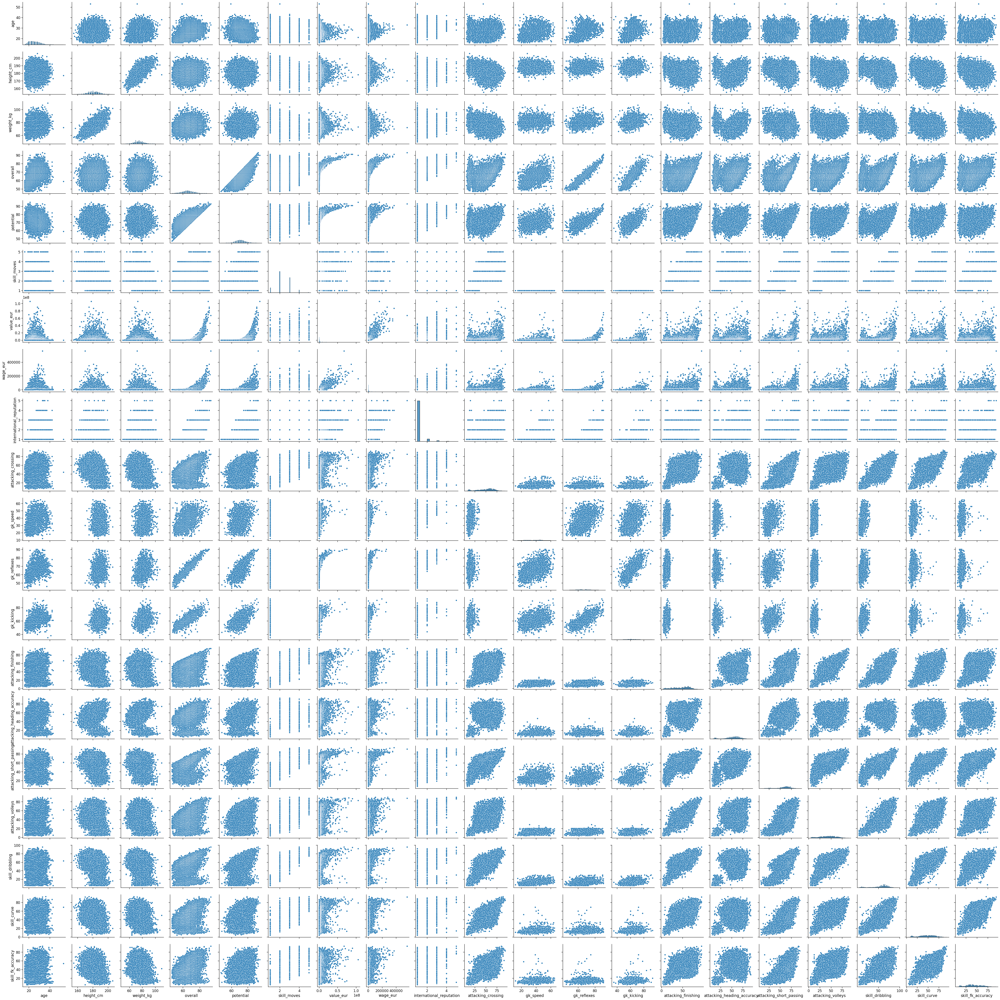

In [123]:
data_foot = data_fifa[['age','height_cm','weight_kg','overall','potential','skill_moves',
                        'value_eur','wage_eur','international_reputation','attacking_crossing','gk_speed','gk_reflexes',
                        'gk_kicking','attacking_finishing','attacking_heading_accuracy','attacking_short_passing',
                        'attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy']]
sns.pairplot(data=data_foot)

In [28]:
data_fifa.shape

(18944, 106)

In [29]:
fifa = data_fifa[['age', 'height_cm', 'weight_kg','overall','potential','value_eur', 'wage_eur', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'preferred_foot', 'weak_foot', 'skill_moves', 'work_rate',
'team_position', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning', 'attacking_crossing', 'attacking_finishing',
'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 
'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions',
'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina','power_strength', 'power_long_shots','mentality_aggression', 
'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
'goalkeeping_positioning', 'goalkeeping_reflexes']]

In [30]:
fifa.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,pace,shooting,passing,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,33,170,72,93,93,67500000,560000,85.0,92.0,91.0,...,75,96,NaN,35,24,6,11,15,14,8
1,35,187,83,92,92,46000000,220000,89.0,93.0,81.0,...,84,95,NaN,32,24,7,11,15,14,11
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,11,68,NaN,12,18,87,92,78,90,90
3,31,184,80,91,91,80000000,240000,78.0,91.0,78.0,...,88,88,NaN,42,19,15,6,12,8,10
4,28,175,68,91,91,90000000,270000,91.0,85.0,86.0,...,92,93,NaN,30,29,9,9,15,15,11


In [32]:
fifa.shape

(18944, 58)

# Preprocessing Steps

In [33]:
fifa.describe()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,pace,shooting,passing,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,1.894400e+04,18944.000000,16861.000000,16861.000000,16861.000000,...,18944.000000,18944.000000,0.0,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000,18944.000000
mean,25.225823,181.190773,75.016892,65.677787,71.086729,2.224813e+06,8675.852513,67.668110,52.274954,57.139434,...,48.050412,57.978674,NaN,47.581767,45.546505,16.446052,16.236486,16.103357,16.225982,16.551309
std,4.697354,6.825672,7.057140,7.002278,6.109985,5.102486e+06,19654.774894,10.984862,13.991421,10.273655,...,15.671721,12.118390,NaN,21.402461,20.953997,17.577332,16.845480,16.519399,17.017341,17.878121
min,16.000000,155.000000,50.000000,47.000000,47.000000,0.000000e+00,0.000000,25.000000,16.000000,25.000000,...,6.000000,12.000000,NaN,5.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,21.000000,176.000000,70.000000,61.000000,67.000000,3.000000e+05,1000.000000,62.000000,42.000000,50.000000,...,38.750000,50.000000,NaN,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,25.000000,181.000000,75.000000,66.000000,71.000000,6.500000e+05,3000.000000,68.000000,54.000000,58.000000,...,49.000000,59.000000,NaN,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,29.000000,186.000000,80.000000,70.000000,75.000000,1.800000e+06,7000.000000,75.000000,63.000000,64.000000,...,60.000000,66.000000,NaN,65.000000,63.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,53.000000,206.000000,110.000000,93.000000,95.000000,1.055000e+08,560000.000000,96.000000,93.000000,93.000000,...,92.000000,96.000000,NaN,93.000000,90.000000,90.000000,92.000000,93.000000,91.000000,90.000000


In [34]:
fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18944 entries, 0 to 18943
Data columns (total 58 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         18944 non-null  int64  
 1   height_cm                   18944 non-null  int64  
 2   weight_kg                   18944 non-null  int64  
 3   overall                     18944 non-null  int64  
 4   potential                   18944 non-null  int64  
 5   value_eur                   18944 non-null  int64  
 6   wage_eur                    18944 non-null  int64  
 7   pace                        16861 non-null  float64
 8   shooting                    16861 non-null  float64
 9   passing                     16861 non-null  float64
 10  dribbling                   16861 non-null  float64
 11  defending                   16861 non-null  float64
 12  physic                      16861 non-null  float64
 13  preferred_foot              189

In [35]:
fifa = fifa.drop(['gk_positioning'], axis = 1)

In [37]:
# filling Goal Keeping NaN values using Average Imputation. There are many NaN values in Goal Keeping Columns.

In [36]:
divin_mean = fifa['gk_diving'].mean()
divin_mean

65.16418626980317

In [37]:
divin_null = fifa[fifa['gk_diving'].isnull()].index.tolist()

In [38]:
fifa['gk_diving'].iloc[divin_null] = 65.42

In [41]:
# A function to reduce the number of lines and fill the null values in the columns. Only those columns to 
# be passed in the function where we have to fill the mean of all values in columns.

In [39]:
def null_imputer(data):
    data_mean = data.mean()
    #return data_mean
    data_null = data.isnull().index.tolist()
    data.iloc[data_null] = data_mean

In [46]:
cols = ['gk_handling','gk_kicking','gk_reflexes']
for col in range(len(cols)):
    print(cols[col])
    null_imputer(fifa[cols[col]])

gk_handling
gk_kicking
gk_reflexes


In [47]:
fifa.isnull().sum()

age                               0
height_cm                         0
weight_kg                         0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
pace                           2083
shooting                       2083
passing                        2083
dribbling                      2083
defending                      2083
physic                         2083
preferred_foot                    0
weak_foot                         0
skill_moves                       0
work_rate                         0
team_position                   225
gk_diving                         0
gk_handling                       0
gk_kicking                        0
gk_reflexes                       0
gk_speed                      16861
attacking_crossing                0
attacking_finishing               0
attacking_heading_accuracy        0
attacking_short_passing           0
attacking_volleys           

In [48]:
fifa.team_position.unique()

array(['CAM', 'LS', 'GK', 'ST', 'LW', 'RCM', 'LCB', 'RW', 'SUB', 'CF',
       'CDM', 'RDM', 'RS', 'LCM', 'RB', 'LB', 'LM', 'RCB', 'LF', 'CB',
       'RM', 'LDM', 'RF', 'RES', 'LWB', 'CM', nan, 'LAM', 'RWB', 'RAM'],
      dtype=object)

In [49]:
# These are the rows which have null values in Team_position colunm.
null_rows = fifa['team_position'].isnull()

In [50]:
fifa.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,pace,shooting,passing,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,33,170,72,93,93,67500000,560000,85.0,92.0,91.0,...,75,96,NaN,35,24,6,11,15,14,8
1,35,187,83,92,92,46000000,220000,89.0,93.0,81.0,...,84,95,NaN,32,24,7,11,15,14,11
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,11,68,NaN,12,18,87,92,78,90,90
3,31,184,80,91,91,80000000,240000,78.0,91.0,78.0,...,88,88,NaN,42,19,15,6,12,8,10
4,28,175,68,91,91,90000000,270000,91.0,85.0,86.0,...,92,93,NaN,30,29,9,9,15,15,11


In [51]:
fifa['preferred_foot'].value_counts()

preferred_foot
Right    14448
Left      4496
Name: count, dtype: int64

In [52]:
# performing label encoding with the "preferred_foot" column
fifa.replace({"Right" : 1, "Left": 0}, inplace = True)

In [53]:
fifa['preferred_foot'].value_counts()

preferred_foot
1    14448
0     4496
Name: count, dtype: int64

In [54]:
fifa['work_rate'].value_counts()

work_rate
Medium/Medium    9980
High/Medium      3455
Medium/High      1798
High/High        1031
Medium/Low        913
High/Low          786
Low/Medium        482
Low/High          446
Low/Low            53
Name: count, dtype: int64

In [57]:
# numerical and categorical features

numerical_features = [feature for feature in fifa.columns if fifa[feature].dtype != 'O']
categorical_feature = [feature for feature in fifa.columns if fifa[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numerical_features), numerical_features))
print('We have {} categorical features : {}'.format(len(categorical_feature), categorical_feature))

We have 55 numerical features : ['age', 'height_cm', 'weight_kg', 'overall', 'potential', 'value_eur', 'wage_eur', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'preferred_foot', 'weak_foot', 'skill_moves', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeepin

In [58]:
fifa['team_position'].value_counts()

team_position
SUB    8065
RES    3163
GK      681
LCB     681
RCB     681
RB      553
LB      553
ST      452
LCM     425
RCM     425
RM      420
LM      420
CAM     286
RDM     248
LDM     248
RS      224
LS      224
CDM     181
RW      170
LW      170
CB      128
LWB      78
RWB      78
CM       76
LAM      25
RAM      25
CF       13
LF       13
RF       13
Name: count, dtype: int64

In [55]:
values = fifa['work_rate']

In [61]:
label_encoder = LabelEncoder()
label_encoder.fit_transform(values)
#print(integer_encoded)

array([7, 1, 8, ..., 5, 4, 4])

In [62]:
fifa['work_rate'].value_counts()

work_rate
Medium/Medium    9980
High/Medium      3455
Medium/High      1798
High/High        1031
Medium/Low        913
High/Low          786
Low/Medium        482
Low/High          446
Low/Low            53
Name: count, dtype: int64

In [63]:
null_count = fifa['pace'].isnull().sum()
mean = fifa['pace'].mean()
median = fifa['pace'].median()

In [64]:
fifa['pace_median'] = fifa['pace'].fillna(median)

# Now replace with the mean.
fifa['pace_mean'] = fifa['pace'].fillna(mean)
fifa.head(5)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,pace,shooting,passing,...,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,pace_mean
0,33,170,72,93,93,67500000,560000,85.0,92.0,91.0,...,NaN,35,24,6,11,15,14,8,85.0,85.00000
1,35,187,83,92,92,46000000,220000,89.0,93.0,81.0,...,NaN,32,24,7,11,15,14,11,89.0,89.00000
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,NaN,12,18,87,92,78,90,90,68.0,67.66811
3,31,184,80,91,91,80000000,240000,78.0,91.0,78.0,...,NaN,42,19,15,6,12,8,10,78.0,78.00000
4,28,175,68,91,91,90000000,270000,91.0,85.0,86.0,...,NaN,30,29,9,9,15,15,11,91.0,91.00000


In [65]:
print('Original variable variance: ', fifa['pace'].var())
print('Variance after median imputation: ', fifa['pace_median'].var())
print('Variance after mean imputation: ', fifa['pace_mean'].var())

Original variable variance:  120.66718521118493
Variance after median imputation:  107.40922549832999
Variance after mean imputation:  107.39844494856028


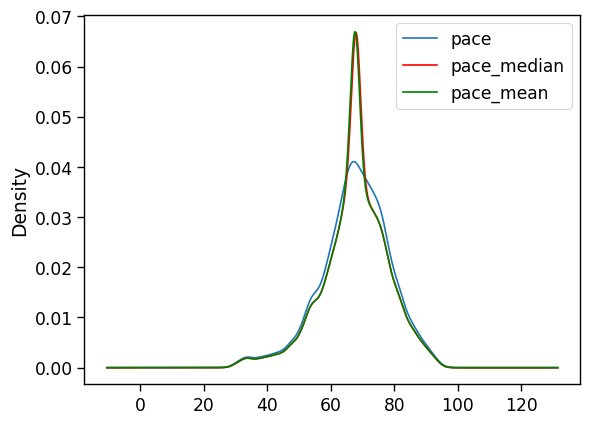

In [66]:
fig = plt.figure()
ax = fig.add_subplot(111)

# original variable distribution
fifa['pace'].plot(kind='kde', ax=ax)

# variable imputed with the median
fifa['pace_median'].plot(kind='kde', ax=ax, color='red')

# variable imputed with the mean
fifa['pace_mean'].plot(kind='kde', ax=ax, color='green')

# add legends
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

<Axes: >

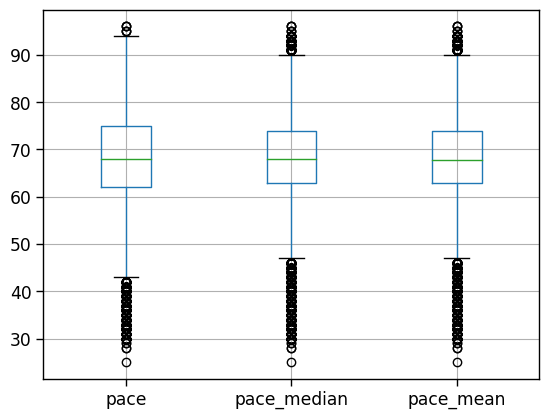

In [67]:
fifa[['pace', 'pace_median', 'pace_mean']].boxplot()

Mean median imputation 
End distribution imputation
Check for the outlier count the variable through boxplot and compare them 
and use the method for other variables if possible. 
reduction of outlier is important as it creates distortation.
create PIPELINE

this is for Numerical variables only

In [68]:
fifa.drop(['pace', 'pace_mean'], axis=1)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,shooting,passing,dribbling,...,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median
0,33,170,72,93,93,67500000,560000,92.0,91.0,95.0,...,96,NaN,35,24,6,11,15,14,8,85.0
1,35,187,83,92,92,46000000,220000,93.0,81.0,89.0,...,95,NaN,32,24,7,11,15,14,11,89.0
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,68,NaN,12,18,87,92,78,90,90,68.0
3,31,184,80,91,91,80000000,240000,91.0,78.0,85.0,...,88,NaN,42,19,15,6,12,8,10,78.0
4,28,175,68,91,91,90000000,270000,85.0,86.0,94.0,...,93,NaN,30,29,9,9,15,15,11,91.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18939,24,176,73,47,52,40000,500,37.0,50.0,47.0,...,36,NaN,39,54,10,9,14,6,6,63.0
18940,21,177,70,47,52,35000,1000,23.0,26.0,27.0,...,40,NaN,56,47,12,13,8,14,6,58.0
18941,20,185,74,47,51,35000,1000,25.0,29.0,36.0,...,40,NaN,55,45,12,9,14,15,13,51.0
18942,23,186,80,47,51,40000,1000,35.0,48.0,48.0,...,43,NaN,49,45,15,7,7,5,13,61.0


In [69]:
null_count = fifa['shooting'].isnull().sum()
mean = fifa['shooting'].mean()
median = fifa['shooting'].median()

In [70]:
fifa['shooting_median'] = fifa['shooting'].fillna(median)

# Now replace with the mean.
fifa['shooting_mean'] = fifa['shooting'].fillna(mean)
fifa.head(5)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,pace,shooting,passing,...,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,pace_mean,shooting_median,shooting_mean
0,33,170,72,93,93,67500000,560000,85.0,92.0,91.0,...,24,6,11,15,14,8,85.0,85.00000,92.0,92.000000
1,35,187,83,92,92,46000000,220000,89.0,93.0,81.0,...,24,7,11,15,14,11,89.0,89.00000,93.0,93.000000
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,18,87,92,78,90,90,68.0,67.66811,54.0,52.274954
3,31,184,80,91,91,80000000,240000,78.0,91.0,78.0,...,19,15,6,12,8,10,78.0,78.00000,91.0,91.000000
4,28,175,68,91,91,90000000,270000,91.0,85.0,86.0,...,29,9,9,15,15,11,91.0,91.00000,85.0,85.000000


In [71]:
print('Original variable variance: ', fifa['shooting'].var())
print('Variance after median imputation: ', fifa['shooting_median'].var())
print('Variance after mean imputation: ', fifa['shooting_mean'].var())

Original variable variance:  195.75986435880057
Variance after median imputation:  174.52506487055405
Variance after mean imputation:  174.23382321117973


<Axes: >

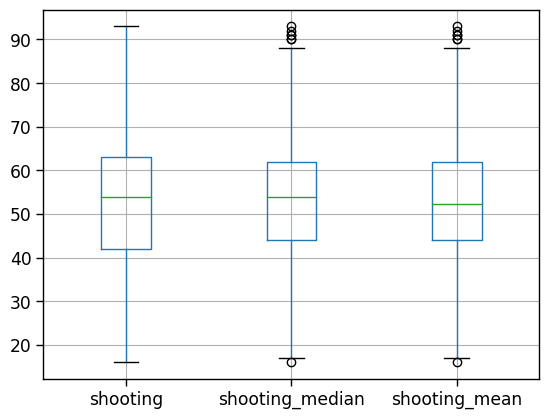

In [72]:
fifa[['shooting', 'shooting_median', 'shooting_mean']].boxplot()

In [73]:
fifa = fifa.drop(['pace', 'shooting','shooting_mean','pace_mean'], axis=1)

In [74]:
null_count = fifa['passing'].isnull().sum()
mean = fifa['passing'].mean()
median = fifa['passing'].median()

In [75]:
fifa['passing_median'] = fifa['passing'].fillna(median)

# Now replace with the mean.
fifa['passing_mean'] = fifa['passing'].fillna(mean)
fifa.head(5)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,passing,dribbling,defending,...,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,shooting_median,passing_median,passing_mean
0,33,170,72,93,93,67500000,560000,91.0,95.0,38.0,...,24,6,11,15,14,8,85.0,92.0,91.0,91.000000
1,35,187,83,92,92,46000000,220000,81.0,89.0,35.0,...,24,7,11,15,14,11,89.0,93.0,81.0,81.000000
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,18,87,92,78,90,90,68.0,54.0,58.0,57.139434
3,31,184,80,91,91,80000000,240000,78.0,85.0,43.0,...,19,15,6,12,8,10,78.0,91.0,78.0,78.000000
4,28,175,68,91,91,90000000,270000,86.0,94.0,36.0,...,29,9,9,15,15,11,91.0,85.0,86.0,86.000000


In [76]:
print('Original variable variance: ', fifa['passing'].var())
print('Variance after median imputation: ', fifa['passing_median'].var())
print('Variance after mean imputation: ', fifa['passing_mean'].var())

Original variable variance:  105.54799467391707
Variance after median imputation:  94.01426308397096
Variance after mean imputation:  93.9417827272471


<Axes: >

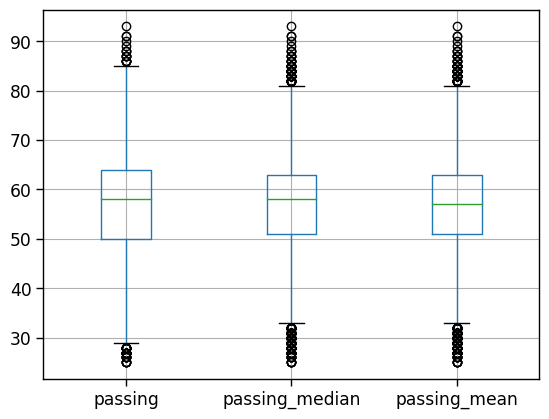

In [77]:
fifa[['passing', 'passing_median', 'passing_mean']].boxplot()

In [78]:
fifa = fifa.drop(['passing','passing_mean'], axis=1)

In [79]:
fifa.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,dribbling,defending,physic,...,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,shooting_median,passing_median
0,33,170,72,93,93,67500000,560000,95.0,38.0,65.0,...,35,24,6,11,15,14,8,85.0,92.0,91.0
1,35,187,83,92,92,46000000,220000,89.0,35.0,77.0,...,32,24,7,11,15,14,11,89.0,93.0,81.0
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,12,18,87,92,78,90,90,68.0,54.0,58.0
3,31,184,80,91,91,80000000,240000,85.0,43.0,82.0,...,42,19,15,6,12,8,10,78.0,91.0,78.0
4,28,175,68,91,91,90000000,270000,94.0,36.0,59.0,...,30,29,9,9,15,15,11,91.0,85.0,86.0


In [80]:
fifa.isnull().sum()

age                               0
height_cm                         0
weight_kg                         0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
dribbling                      2083
defending                      2083
physic                         2083
preferred_foot                    0
weak_foot                         0
skill_moves                       0
work_rate                         0
team_position                   225
gk_diving                         0
gk_handling                       0
gk_kicking                        0
gk_reflexes                       0
gk_speed                      16861
attacking_crossing                0
attacking_finishing               0
attacking_heading_accuracy        0
attacking_short_passing           0
attacking_volleys                 0
skill_dribbling                   0
skill_curve                       0
skill_fk_accuracy           

In [81]:
null_count = fifa['dribbling'].isnull().sum()
mean = fifa['dribbling'].mean()
median = fifa['dribbling'].median()

In [82]:
fifa['dribbling_median'] = fifa['dribbling'].fillna(median)

# Now replace with the mean.
fifa['dribbling_mean'] = fifa['dribbling'].fillna(mean)
fifa.head(5)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,dribbling,defending,physic,...,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,shooting_median,passing_median,dribbling_median,dribbling_mean
0,33,170,72,93,93,67500000,560000,95.0,38.0,65.0,...,6,11,15,14,8,85.0,92.0,91.0,95.0,95.00000
1,35,187,83,92,92,46000000,220000,89.0,35.0,77.0,...,7,11,15,14,11,89.0,93.0,81.0,89.0,89.00000
2,27,188,87,91,93,75000000,125000,NaN,NaN,NaN,...,87,92,78,90,90,68.0,54.0,58.0,64.0,62.45543
3,31,184,80,91,91,80000000,240000,85.0,43.0,82.0,...,15,6,12,8,10,78.0,91.0,78.0,85.0,85.00000
4,28,175,68,91,91,90000000,270000,94.0,36.0,59.0,...,9,9,15,15,11,91.0,85.0,86.0,94.0,94.00000


In [83]:
print('Original variable variance: ', fifa['dribbling'].var())
print('Variance after median imputation: ', fifa['dribbling_median'].var())
print('Variance after mean imputation: ', fifa['dribbling_mean'].var())

Original variable variance:  100.97649794851111
Variance after median imputation:  90.106464059564
Variance after mean imputation:  89.87297447140882


<Axes: >

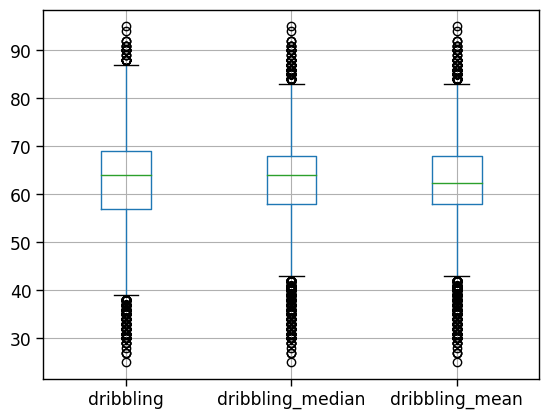

In [84]:
fifa[['dribbling', 'dribbling_median', 'dribbling_mean']].boxplot()

In [85]:
fifa = fifa.drop(['dribbling','dribbling_mean'], axis=1)

In [86]:
null_count = fifa['defending'].isnull().sum()
mean = fifa['defending'].mean()
median = fifa['defending'].median()

In [87]:
fifa['defending_median'] = fifa['defending'].fillna(median)

# Now replace with the mean.
fifa['defending_mean'] = fifa['defending'].fillna(mean)
fifa.head(5)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,defending,physic,preferred_foot,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,shooting_median,passing_median,dribbling_median,defending_median,defending_mean
0,33,170,72,93,93,67500000,560000,38.0,65.0,0,...,11,15,14,8,85.0,92.0,91.0,95.0,38.0,38.000000
1,35,187,83,92,92,46000000,220000,35.0,77.0,1,...,11,15,14,11,89.0,93.0,81.0,89.0,35.0,35.000000
2,27,188,87,91,93,75000000,125000,NaN,NaN,1,...,92,78,90,90,68.0,54.0,58.0,64.0,56.0,51.316292
3,31,184,80,91,91,80000000,240000,43.0,82.0,1,...,6,12,8,10,78.0,91.0,78.0,85.0,43.0,43.000000
4,28,175,68,91,91,90000000,270000,36.0,59.0,1,...,9,15,15,11,91.0,85.0,86.0,94.0,36.0,36.000000


In [88]:
print('Original variable variance: ', fifa['defending'].var())
print('Variance after median imputation: ', fifa['defending_median'].var())
print('Variance after mean imputation: ', fifa['defending_mean'].var())

Original variable variance:  269.1299059654816
Variance after median imputation:  241.6829863256198
Variance after mean imputation:  239.53598767766564


<Axes: >

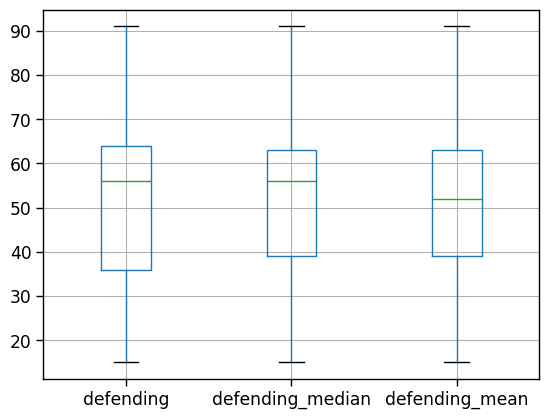

In [89]:
fifa[['defending', 'defending_median', 'defending_mean']].boxplot()

In [90]:
fifa = fifa.drop(['defending','defending_mean'], axis=1)

In [91]:
null_count = fifa['physic'].isnull().sum()
mean = fifa['physic'].mean()
median = fifa['physic'].median()

In [92]:
fifa['physic_median'] = fifa['physic'].fillna(median)

# Now replace with the mean.
fifa['physic_mean'] = fifa['physic'].fillna(mean)
fifa.head(5)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,physic,preferred_foot,weak_foot,...,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,shooting_median,passing_median,dribbling_median,defending_median,physic_median,physic_mean
0,33,170,72,93,93,67500000,560000,65.0,0,4,...,15,14,8,85.0,92.0,91.0,95.0,38.0,65.0,65.000000
1,35,187,83,92,92,46000000,220000,77.0,1,4,...,15,14,11,89.0,93.0,81.0,89.0,35.0,77.0,77.000000
2,27,188,87,91,93,75000000,125000,NaN,1,3,...,78,90,90,68.0,54.0,58.0,64.0,56.0,66.0,64.458988
3,31,184,80,91,91,80000000,240000,82.0,1,4,...,12,8,10,78.0,91.0,78.0,85.0,43.0,82.0,82.000000
4,28,175,68,91,91,90000000,270000,59.0,1,5,...,15,15,11,91.0,85.0,86.0,94.0,36.0,59.0,59.000000


In [93]:
print('Original variable variance: ', fifa['physic'].var())
print('Variance after median imputation: ', fifa['physic_median'].var())
print('Variance after mean imputation: ', fifa['physic_mean'].var())

Original variable variance:  94.99827344831859
Variance after median imputation:  84.78453924796705
Variance after mean imputation:  84.55212428541685


<Axes: >

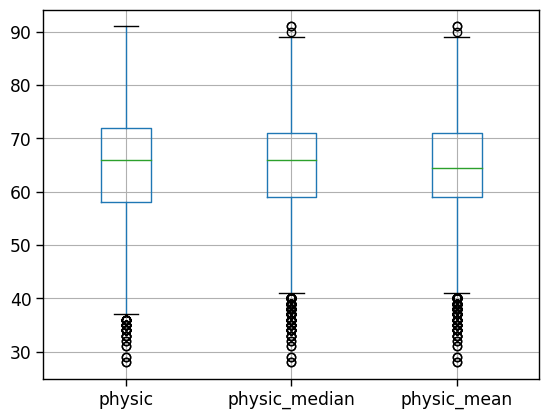

In [94]:
fifa[['physic', 'physic_median', 'physic_mean']].boxplot()

In [95]:
fifa = fifa.drop(['physic','physic_mean'], axis=1)

In [96]:
fifa.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,weak_foot,skill_moves,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,pace_median,shooting_median,passing_median,dribbling_median,defending_median,physic_median
0,33,170,72,93,93,67500000,560000,0,4,4,...,11,15,14,8,85.0,92.0,91.0,95.0,38.0,65.0
1,35,187,83,92,92,46000000,220000,1,4,5,...,11,15,14,11,89.0,93.0,81.0,89.0,35.0,77.0
2,27,188,87,91,93,75000000,125000,1,3,1,...,92,78,90,90,68.0,54.0,58.0,64.0,56.0,66.0
3,31,184,80,91,91,80000000,240000,1,4,4,...,6,12,8,10,78.0,91.0,78.0,85.0,43.0,82.0
4,28,175,68,91,91,90000000,270000,1,5,5,...,9,15,15,11,91.0,85.0,86.0,94.0,36.0,59.0


In [97]:
fifa['team_position'].unique()

array(['CAM', 'LS', 'GK', 'ST', 'LW', 'RCM', 'LCB', 'RW', 'SUB', 'CF',
       'CDM', 'RDM', 'RS', 'LCM', 'RB', 'LB', 'LM', 'RCB', 'LF', 'CB',
       'RM', 'LDM', 'RF', 'RES', 'LWB', 'CM', nan, 'LAM', 'RWB', 'RAM'],
      dtype=object)

Text(0, 0.5, 'count')

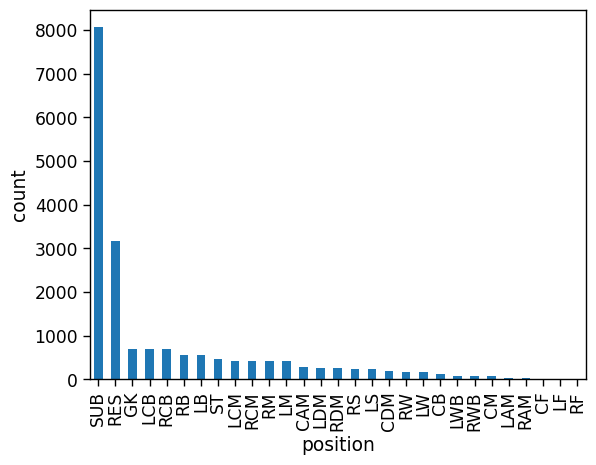

In [98]:
fifa['team_position'].value_counts().sort_values(ascending=False).plot.bar()
plt.xlabel('position')
plt.ylabel('count')

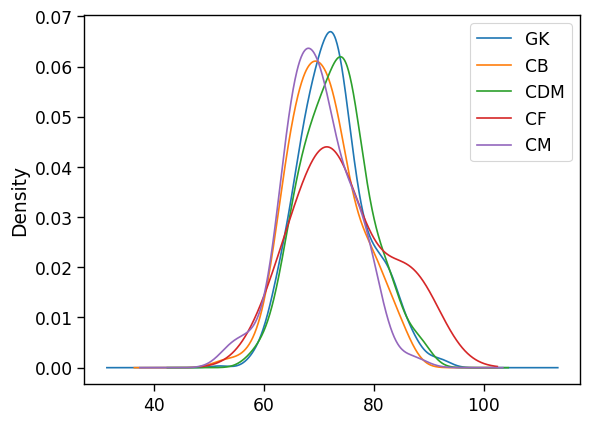

In [99]:
# let's plot the distribution of the target for the houses
# that show the different categories of the variable

fig = plt.figure()
ax = fig.add_subplot(111)

# a plot per category
fifa[fifa['team_position']=='GK']['potential'].plot(kind='kde', ax=ax)
fifa[fifa['team_position']=='CB']['potential'].plot(kind='kde', ax=ax)
fifa[fifa['team_position']=='CDM']['potential'].plot(kind='kde', ax=ax)
fifa[fifa['team_position']=='CF']['potential'].plot(kind='kde', ax=ax)
fifa[fifa['team_position']=='CM']['potential'].plot(kind='kde', ax=ax)

# add the legend
lines, labels = ax.get_legend_handles_labels()
labels = ['GK', 'CB', 'CDM', 'CF', 'CM']
ax.legend(lines, labels, loc='best')

In [100]:
# We are using 'Missing' to fill NaN values because it is not possible to fill any Random value in Team position. The player can 
# be of any position. So here we have created a another variable in this feature to nan values.
fifa['team_position'].fillna('Missing', inplace=True)

In [102]:
fifa = fifa.drop(['gk_speed'], axis=1)

In [103]:
fifa.isnull().sum()

age                               0
height_cm                         0
weight_kg                         0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
preferred_foot                    0
weak_foot                         0
skill_moves                       0
work_rate                         0
team_position                     0
gk_diving                         0
gk_handling                       0
gk_kicking                        0
gk_reflexes                       0
attacking_crossing                0
attacking_finishing               0
attacking_heading_accuracy        0
attacking_short_passing           0
attacking_volleys                 0
skill_dribbling                   0
skill_curve                       0
skill_fk_accuracy                 0
skill_long_passing                0
skill_ball_control                0
movement_acceleration             0
movement_sprint_speed       

In [103]:
# Next step from here would be of Data Transformation.

In [104]:
fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18944 entries, 0 to 18943
Data columns (total 56 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         18944 non-null  int64  
 1   height_cm                   18944 non-null  int64  
 2   weight_kg                   18944 non-null  int64  
 3   overall                     18944 non-null  int64  
 4   potential                   18944 non-null  int64  
 5   value_eur                   18944 non-null  int64  
 6   wage_eur                    18944 non-null  int64  
 7   preferred_foot              18944 non-null  int64  
 8   weak_foot                   18944 non-null  int64  
 9   skill_moves                 18944 non-null  int64  
 10  work_rate                   18944 non-null  object 
 11  team_position               18944 non-null  object 
 12  gk_diving                   18944 non-null  float64
 13  gk_handling                 189

In [105]:
fifa.to_csv("fifa_cleaned.csv", index=False)